# <font color='black'> Auto Insurance Fraud Detection</font>

This project investigates the question: How do machine learning models perform in predicting whether an auto insurance claim is fraud or not?

Using the [Auto Insurance Claims dataset](https://www.kaggle.com/buntyshah/auto-insurance-claims-data), the aim was to train and evaluate classification models in predicting the target variable, 'fraud_reported' (whether a fraud was reported or not) for auto insurance claims.  

## Table of Contents

1. [Data Preparation](#a_ID)

2. [Visualizations](#b_ID)

    2.1 [Univariate Analysis](#b1_ID)
    
    2.2 [Bivariate Analysis](#b2_ID)

### Import libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

## <a id='a_ID'> 1. Data Preparation </a>

In [2]:
# Load data
insurance_claims = pd.read_csv("insurance_claims.csv")

In [3]:
# Check dataset
insurance_claims.shape

(1000, 40)

There are 1000 records and 40 attributes.

In [4]:
print(insurance_claims.head())
print(insurance_claims.tail())
print(insurance_claims.sample(5, random_state=1))

   months_as_customer  age  policy_number policy_bind_date policy_state  \
0                 328   48         521585       2014-10-17           OH   
1                 228   42         342868       2006-06-27           IN   
2                 134   29         687698       2000-09-06           OH   
3                 256   41         227811       1990-05-25           IL   
4                 228   44         367455       2014-06-06           IL   

  policy_csl  policy_deductable  policy_annual_premium  umbrella_limit  \
0    250/500               1000                1406.91               0   
1    250/500               2000                1197.22         5000000   
2    100/300               2000                1413.14         5000000   
3    250/500               2000                1415.74         6000000   
4   500/1000               1000                1583.91         6000000   

   insured_zip  ... police_report_available total_claim_amount injury_claim  \
0       466132  ...      

In [5]:
insurance_claims.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

There are no missing values for all but one attribute, 'c_39', in which all its values are missing and could be dropped.  There are 39 attribtues and 'fraud_reported' is the target variable. There are 17 numerical, 19 string and 2 date attributes.

In [6]:
# Statistics summary for numerical attributes 
print(insurance_claims.describe())

       months_as_customer          age  policy_number  policy_deductable  \
count         1000.000000  1000.000000    1000.000000        1000.000000   
mean           203.954000    38.948000  546238.648000        1136.000000   
std            115.113174     9.140287  257063.005276         611.864673   
min              0.000000    19.000000  100804.000000         500.000000   
25%            115.750000    32.000000  335980.250000         500.000000   
50%            199.500000    38.000000  533135.000000        1000.000000   
75%            276.250000    44.000000  759099.750000        2000.000000   
max            479.000000    64.000000  999435.000000        2000.000000   

       policy_annual_premium  umbrella_limit    insured_zip  capital-gains  \
count            1000.000000    1.000000e+03    1000.000000    1000.000000   
mean             1256.406150    1.101000e+06  501214.488000   25126.100000   
std               244.167395    2.297407e+06   71701.610941   27872.187708   
min

In [7]:
# Dropping the 'c_39' empty attribute
insurance_claims = insurance_claims.drop('_c39', axis=1)

### Check for duplicate records

In [8]:
insurance_claims.duplicated().sum()

0

There are no duplicate records in this dataset.

### Missing values

In [9]:
# Check for the unique values in each attribute
insurance_claims_vars = list(insurance_claims.columns)
for i in insurance_claims_vars:
    print(i, ":\n", insurance_claims[i].unique())

months_as_customer :
 [328 228 134 256 137 165  27 212 235 447  60 121 180 473  70 140 160 196
 460 217 370 413 237   8 257 202 224 241  64 166 155 114 149 147  62 289
 431 199  79 116  37 106 269 265 163 355 175 192 430  91 223 195  22 439
  94  11 151 154 245 119 215 295 254 107 478 128 338 271 222 120 270 319
 194 227 244  78 200 284 275 153  31  41 127  61 207 219  80 325  29 239
 279 350 464 118 298  87 261 453 210 168 390 258 225 164 255 206 203 211
 274  81 280 112  24  93 171 124 287 122 398 214 209  82 193 288 104 101
 375 461 428  45 136 216 278 108  14 276  47  73 294 324  53 426 111  86
 296 125 177 238 449 252 359  19 285  30 342 468 343 404  63 335 142 272
  69  38 281 246 330 362 371 377 172  99 249 190 174  95   2 117 242 440
  20 208 156 232  84 394  35 369 332 243 264  32 259 186 201 436 189 105
  88  40  59  39 123 231 247  48 267 286 253  10 158   1  85 233 266  97
 399 305 129 283  96 176 159 290 299  66 334 429  15 230 250  65 475  77
 229 110 292 451 150 291 162 

In [10]:
# Number of unique values in each attribute
insurance_claims_vars = list(insurance_claims.columns)
for i in insurance_claims_vars:
    print(i, ":", insurance_claims[i].nunique())

months_as_customer : 391
age : 46
policy_number : 1000
policy_bind_date : 951
policy_state : 3
policy_csl : 3
policy_deductable : 3
policy_annual_premium : 991
umbrella_limit : 11
insured_zip : 995
insured_sex : 2
insured_education_level : 7
insured_occupation : 14
insured_hobbies : 20
insured_relationship : 6
capital-gains : 338
capital-loss : 354
incident_date : 60
incident_type : 4
collision_type : 4
incident_severity : 4
authorities_contacted : 5
incident_state : 7
incident_city : 7
incident_location : 1000
incident_hour_of_the_day : 24
number_of_vehicles_involved : 4
property_damage : 3
bodily_injuries : 3
witnesses : 4
police_report_available : 3
total_claim_amount : 763
injury_claim : 638
property_claim : 626
vehicle_claim : 726
auto_make : 14
auto_model : 39
auto_year : 21
fraud_reported : 2


Since 'policy_number' and 'incident_location' have 1000 unique values for 1000 records, these attributes could alsp be dropped.

In [11]:
# Dropping 'policy_number' and 'incident_location' attributes
insurance_claims = insurance_claims.drop('policy_number', axis=1)
insurance_claims = insurance_claims.drop('incident_location', axis=1)

In [12]:
insurance_claims.shape

(1000, 37)

### Datetime Attributes

In [13]:
# Check type of 'policy_bind_date' and 'incident_date' attributes
print(insurance_claims['policy_bind_date'].dtype)
print(insurance_claims['incident_date'].dtype)

object
object


In [14]:
# Change date attributes to datetime
insurance_claims['policy_bind_date'] = pd.to_datetime(insurance_claims['policy_bind_date'])
insurance_claims['incident_date'] = pd.to_datetime(insurance_claims['incident_date'])
print(insurance_claims['policy_bind_date'].dtype)
print(insurance_claims['incident_date'].dtype)

datetime64[ns]
datetime64[ns]


In [15]:
print("The earliest date for 'policy_bind_date' is", insurance_claims['policy_bind_date'].min())
print("The latest date for 'policy_bind_date' is", insurance_claims['policy_bind_date'].max())

print("The earliest date for 'incident_date' is", insurance_claims['incident_date'].min())
print("The latest date for 'incident_date' is", insurance_claims['incident_date'].max())

The earliest date for 'policy_bind_date' is 1990-01-08 00:00:00
The latest date for 'policy_bind_date' is 2015-02-22 00:00:00
The earliest date for 'incident_date' is 2015-01-01 00:00:00
The latest date for 'incident_date' is 2015-03-01 00:00:00


Extracting 'year', 'month', and 'day' information from these date attributes for new attributes.

In [16]:
# Extracting 'year', 'month' and 'day' to make new attributes
insurance_claims['policy_bind_year'] = insurance_claims['policy_bind_date'].dt.year
insurance_claims['policy_bind_month'] = insurance_claims['policy_bind_date'].dt.month
insurance_claims['policy_bind_day'] = insurance_claims['policy_bind_date'].dt.day

insurance_claims['incident_year'] = insurance_claims['incident_date'].dt.year
insurance_claims['incident_month'] = insurance_claims['incident_date'].dt.month
insurance_claims['incident_day'] = insurance_claims['incident_date'].dt.day

In [17]:
insurance_claims.shape

(1000, 43)

In [18]:
insurance_claims.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 43 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   months_as_customer           1000 non-null   int64         
 1   age                          1000 non-null   int64         
 2   policy_bind_date             1000 non-null   datetime64[ns]
 3   policy_state                 1000 non-null   object        
 4   policy_csl                   1000 non-null   object        
 5   policy_deductable            1000 non-null   int64         
 6   policy_annual_premium        1000 non-null   float64       
 7   umbrella_limit               1000 non-null   int64         
 8   insured_zip                  1000 non-null   int64         
 9   insured_sex                  1000 non-null   object        
 10  insured_education_level      1000 non-null   object        
 11  insured_occupation           1000 non-null  

In [19]:
# Missing Values
insurance_claims.isnull().sum(axis=0)

months_as_customer             0
age                            0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_cla

In [20]:
# Number of unique values in each attribute
insurance_claims_vars = list(insurance_claims.columns)
for i in insurance_claims_vars:
    print(i, ":", insurance_claims[i].nunique())

months_as_customer : 391
age : 46
policy_bind_date : 951
policy_state : 3
policy_csl : 3
policy_deductable : 3
policy_annual_premium : 991
umbrella_limit : 11
insured_zip : 995
insured_sex : 2
insured_education_level : 7
insured_occupation : 14
insured_hobbies : 20
insured_relationship : 6
capital-gains : 338
capital-loss : 354
incident_date : 60
incident_type : 4
collision_type : 4
incident_severity : 4
authorities_contacted : 5
incident_state : 7
incident_city : 7
incident_hour_of_the_day : 24
number_of_vehicles_involved : 4
property_damage : 3
bodily_injuries : 3
witnesses : 4
police_report_available : 3
total_claim_amount : 763
injury_claim : 638
property_claim : 626
vehicle_claim : 726
auto_make : 14
auto_model : 39
auto_year : 21
fraud_reported : 2
policy_bind_year : 26
policy_bind_month : 12
policy_bind_day : 31
incident_year : 1
incident_month : 3
incident_day : 31


In [21]:
insurance_claims['incident_year'].unique()

array([2015], dtype=int64)

Because 'incident_year' has 2015 for all records, it was removed.

In [22]:
insurance_claims = insurance_claims.drop("incident_year", axis=1)

In [23]:
insurance_claims.shape

(1000, 42)

This dataframe now has 1000 records and 42 attributes.

In [24]:
insurance_claims.head()

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,...,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_year,policy_bind_month,policy_bind_day,incident_month,incident_day
0,328,48,2014-10-17,OH,250/500,1000,1406.91,0,466132,MALE,...,52080,Saab,92x,2004,Y,2014,10,17,1,25
1,228,42,2006-06-27,IN,250/500,2000,1197.22,5000000,468176,MALE,...,3510,Mercedes,E400,2007,Y,2006,6,27,1,21
2,134,29,2000-09-06,OH,100/300,2000,1413.14,5000000,430632,FEMALE,...,23100,Dodge,RAM,2007,N,2000,9,6,2,22
3,256,41,1990-05-25,IL,250/500,2000,1415.74,6000000,608117,FEMALE,...,50720,Chevrolet,Tahoe,2014,Y,1990,5,25,1,10
4,228,44,2014-06-06,IL,500/1000,1000,1583.91,6000000,610706,MALE,...,4550,Accura,RSX,2009,N,2014,6,6,2,17


## <a id='b_ID'> 2. Visualizations </a>

Count plots, histograms, boxplots, violin plots, pair plots and scatter plots were used for visualizing the dataset for categorical, date, and numerical attributes in the dataset. Spearman correlation among the features were illustrated in a heatmap and clustermap. Then, categorical features were factorized for later steps.

### <a id='b1_ID'> 2.1 Univariate Anaysis </a>

#### Class Distribution

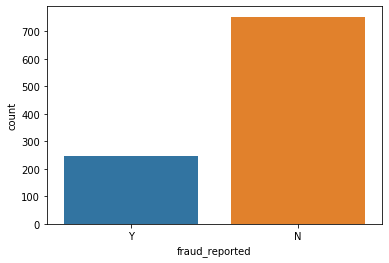

In [25]:
sns.countplot(x=insurance_claims['fraud_reported'])
plt.show()

The dataset is unbalanced and would be balanced using Sythetic Minority Over-sampling Technique (SMOTE) to oversample the 'Y' (yes) class before building the prediction models.

#### Count Plots for Categorical Variables

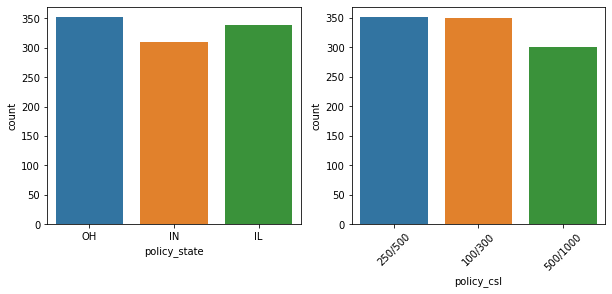

In [26]:
fig = plt.figure(figsize=(10,4))

ax1 = plt.subplot(1, 2, 1)
sns.countplot(x=insurance_claims['policy_state'], ax=ax1)

ax2 = plt.subplot(1, 2, 2)
sns.countplot(x=insurance_claims['policy_csl'], ax=ax2)
plt.xticks(rotation=45)

plt.show()

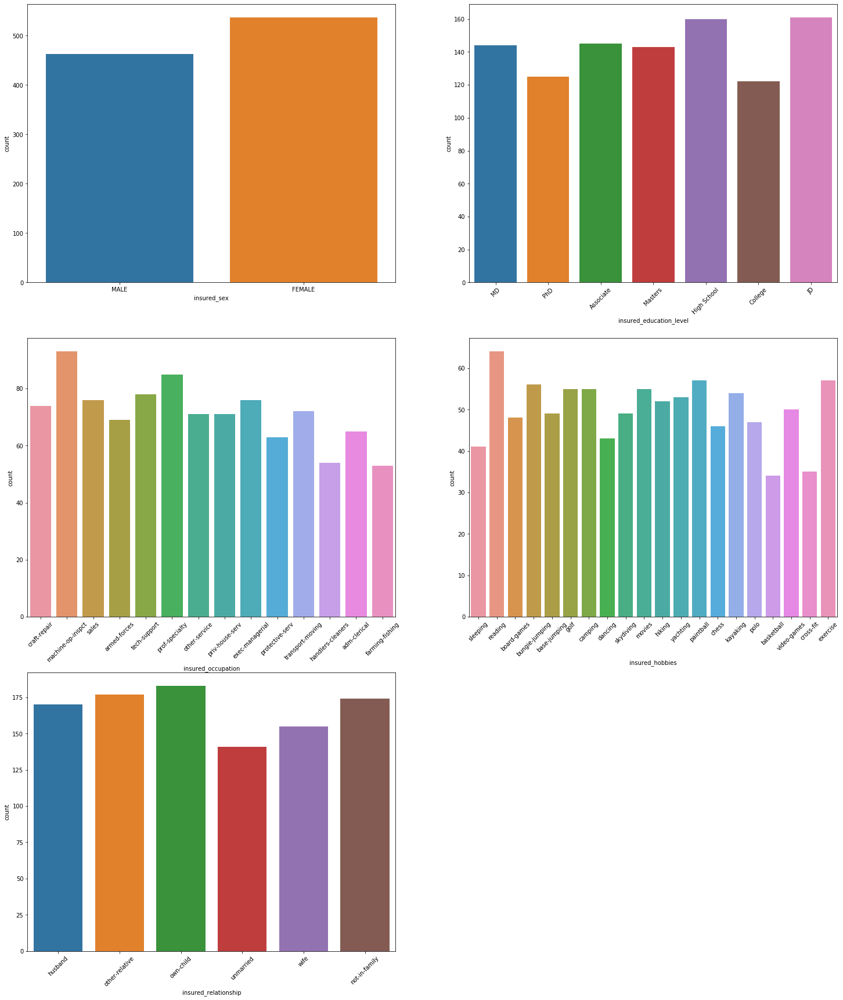

In [27]:
fig = plt.figure(figsize=(25,30))

ax1 = plt.subplot(3, 2, 1)
sns.countplot(x=insurance_claims['insured_sex'], ax=ax1)

ax2 = plt.subplot(3, 2, 2)
sns.countplot(x=insurance_claims['insured_education_level'], ax=ax2)
plt.xticks(rotation=45)

ax3 = plt.subplot(3, 2, 3)
sns.countplot(x=insurance_claims['insured_occupation'], ax=ax3)
plt.xticks(rotation=45)

ax4 = plt.subplot(3, 2, 4)
sns.countplot(x=insurance_claims['insured_hobbies'], ax=ax4)
plt.xticks(rotation=45)

ax5 = plt.subplot(3, 2, 5)
sns.countplot(x=insurance_claims['insured_relationship'], ax=ax5)
plt.xticks(rotation=45)

plt.show()

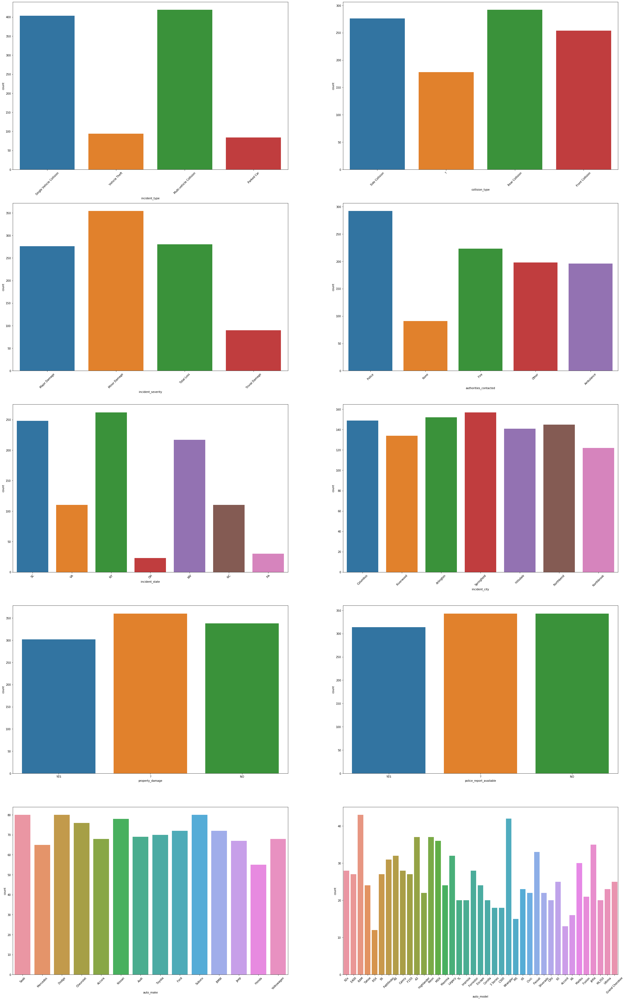

In [28]:
fig = plt.figure(figsize=(40,66))

ax1 = plt.subplot(5, 2, 1)
sns.countplot(x=insurance_claims['incident_type'], ax=ax1)
plt.xticks(rotation=45)

ax2 = plt.subplot(5, 2, 2)
sns.countplot(x=insurance_claims['collision_type'], ax=ax2)
plt.xticks(rotation=45)

ax3 = plt.subplot(5, 2, 3)
sns.countplot(x=insurance_claims['incident_severity'], ax=ax3)
plt.xticks(rotation=45)

ax4 = plt.subplot(5, 2, 4)
sns.countplot(x=insurance_claims['authorities_contacted'], ax=ax4)
plt.xticks(rotation=45)

ax5 = plt.subplot(5, 2, 5)
sns.countplot(x=insurance_claims['incident_state'], ax=ax5)
plt.xticks(rotation=45)

ax6 = plt.subplot(5, 2, 6)
sns.countplot(x=insurance_claims['incident_city'], ax=ax6)
plt.xticks(rotation=45)

ax7 = plt.subplot(5, 2, 7)
sns.countplot(x=insurance_claims['property_damage'], ax=ax7)

ax8 = plt.subplot(5, 2, 8)
sns.countplot(x=insurance_claims['police_report_available'], ax=ax8)

ax9 = plt.subplot(5, 2, 9)
sns.countplot(x=insurance_claims['auto_make'], ax=ax9)
plt.xticks(rotation=45)

ax10 = plt.subplot(5, 2, 10)
sns.countplot(x=insurance_claims['auto_model'], ax=ax10)
plt.xticks(rotation=45)

plt.show()

Looking at the countplots above, it is seen that this dataset is imbalanced and should be balanced before training the classification models.

#### Histograms

##### Date Attributes

C:\Users\sanje\Anaconda3\lib\site-packages\pandas\plotting\_converter.py:129: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


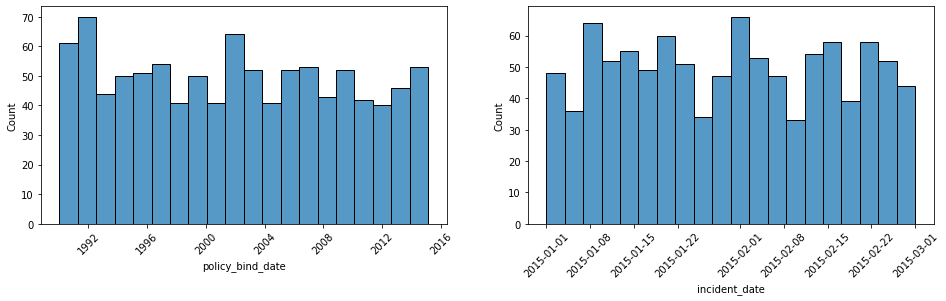

In [29]:
fig = plt.figure(figsize=(16,4))

ax1 = plt.subplot(1, 2, 1)
sns.histplot(insurance_claims['policy_bind_date'], bins=20)
plt.xticks(rotation=45)

ax2 = plt.subplot(1, 2, 2)
sns.histplot(insurance_claims['incident_date'], bins=20)
plt.xticks(rotation=45)

plt.show()

##### Numerical Attributes

In [30]:
# For cleaner results, warnings were ignored
import warnings
warnings.filterwarnings('ignore')

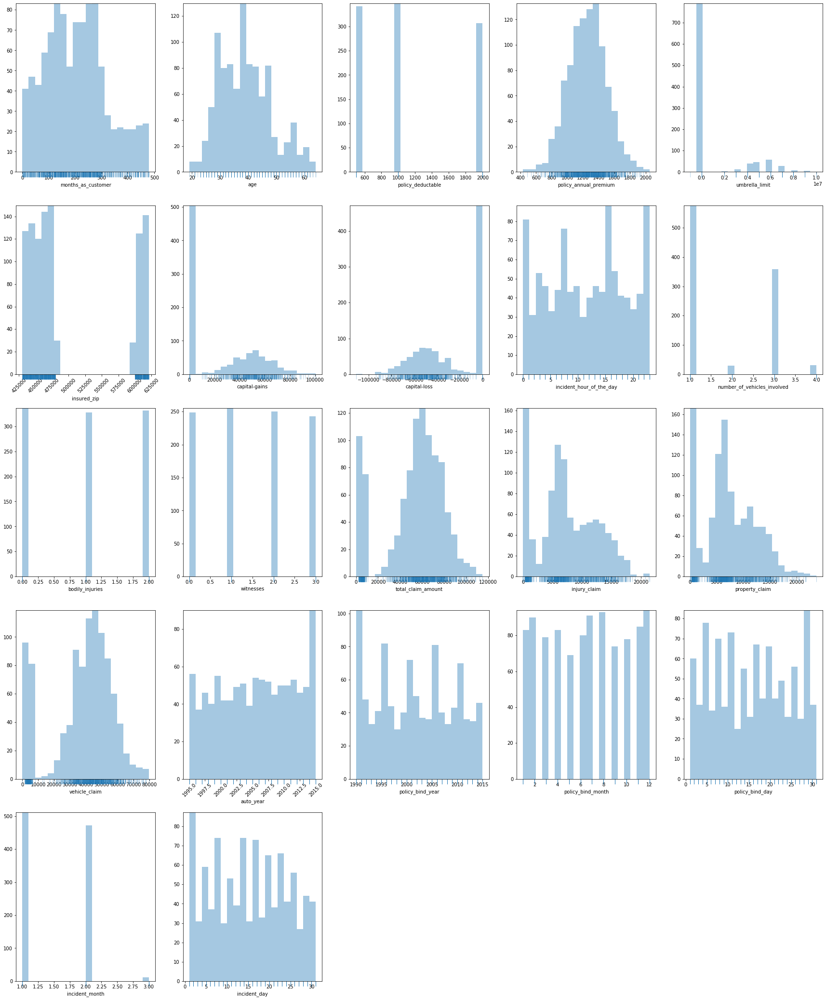

In [31]:
fig = plt.figure(figsize=(30,45))

ax1 = plt.subplot(6, 5, 1)
sns.distplot(insurance_claims['months_as_customer'], bins=20, kde=False, rug=True, rug_kws= {"alpha": 0.3, "height":-.03, "clip_on": False},
             ax=ax1)

ax2 = plt.subplot(6, 5, 2)
sns.distplot(insurance_claims['age'], bins=20, kde=False, rug=True, rug_kws= {"alpha": 0.3, "height":-.03, "clip_on": False},
             ax=ax2)

ax3 = plt.subplot(6, 5, 3)
sns.distplot(insurance_claims['policy_deductable'], bins=20, kde=False, rug=True, rug_kws= {"alpha": 0.3, "height":-.03, "clip_on": False},
             ax=ax3)

ax4 = plt.subplot(6, 5, 4)
sns.distplot(insurance_claims['policy_annual_premium'], bins=20, kde=False, rug=True, rug_kws= {"alpha": 0.3, "height":-.03, "clip_on": False},
             ax=ax4)

ax5 = plt.subplot(6, 5, 5)
sns.distplot(insurance_claims['umbrella_limit'], bins=20, kde=False, rug=True, rug_kws= {"alpha": 0.3, "height":-.03, "clip_on": False},
             ax=ax5)

ax6 = plt.subplot(6, 5, 6)
sns.distplot(insurance_claims['insured_zip'], bins=20, kde=False, rug=True, rug_kws= {"alpha": 0.3, "height":-.03, "clip_on": False},
             ax=ax6)
plt.xticks(rotation=45)

ax7 = plt.subplot(6, 5, 7)
sns.distplot(insurance_claims['capital-gains'], bins=20, kde=False, rug=True, rug_kws= {"alpha": 0.3, "height":-.03, "clip_on": False},
             ax=ax7)

ax8 = plt.subplot(6, 5, 8)
sns.distplot(insurance_claims['capital-loss'], bins=20, kde=False, rug=True, rug_kws= {"alpha": 0.3, "height":-.03, "clip_on": False},
             ax=ax8)

ax9 = plt.subplot(6, 5, 9)
sns.distplot(insurance_claims['incident_hour_of_the_day'], bins=20, kde=False, rug=True, rug_kws= {"alpha": 0.3, "height":-.03, "clip_on": False},
             ax=ax9)

ax10 = plt.subplot(6, 5, 10)
sns.distplot(insurance_claims['number_of_vehicles_involved'], bins=20, kde=False, rug=True, rug_kws= {"alpha": 0.3, "height":-.03, "clip_on": False},
             ax=ax10)

ax11 = plt.subplot(6, 5, 11)
sns.distplot(insurance_claims['bodily_injuries'], bins=20, kde=False, rug=True, rug_kws= {"alpha": 0.3, "height":-.03, "clip_on": False},
             ax=ax11)

ax12 = plt.subplot(6, 5, 12)
sns.distplot(insurance_claims['witnesses'], bins=20, kde=False, rug=True, rug_kws= {"alpha": 0.3, "height":-.03, "clip_on": False},
             ax=ax12)

ax13 = plt.subplot(6, 5, 13)
sns.distplot(insurance_claims['total_claim_amount'], bins=20, kde=False, rug=True, rug_kws= {"alpha": 0.3, "height":-.03, "clip_on": False},
             ax=ax13)

ax14 = plt.subplot(6, 5, 14)
sns.distplot(insurance_claims['injury_claim'], bins=20, kde=False, rug=True, rug_kws= {"alpha": 0.3, "height":-.03, "clip_on": False},
             ax=ax14)

ax15 = plt.subplot(6, 5, 15)
sns.distplot(insurance_claims['property_claim'], bins=20, kde=False, rug=True, rug_kws= {"alpha": 0.3, "height":-.03, "clip_on": False},
             ax=ax15)

ax16 = plt.subplot(6, 5, 16)
sns.distplot(insurance_claims['vehicle_claim'], bins=20, kde=False, rug=True, rug_kws= {"alpha": 0.3, "height":-.03, "clip_on": False},
             ax=ax16)

ax17 = plt.subplot(6, 5, 17)
sns.distplot(insurance_claims['auto_year'], bins=20, kde=False, rug=True, rug_kws= {"alpha": 0.3, "height":-.03, "clip_on": False},
             ax=ax17)
plt.xticks(rotation=45)

ax18 = plt.subplot(6, 5, 18)
sns.distplot(insurance_claims['policy_bind_year'], bins=20, kde=False, rug=True, rug_kws= {"alpha": 0.3, "height":-.03, "clip_on": False},
             ax=ax18)

ax19 = plt.subplot(6, 5, 19)
sns.distplot(insurance_claims['policy_bind_month'], bins=20, kde=False, rug=True, rug_kws= {"alpha": 0.3, "height":-.03, "clip_on": False},
             ax=ax19)

ax20 = plt.subplot(6, 5, 20)
sns.distplot(insurance_claims['policy_bind_day'], bins=20, kde=False, rug=True, rug_kws= {"alpha": 0.3, "height":-.03, "clip_on": False},
             ax=ax20)

ax21 = plt.subplot(6, 5, 21)
sns.distplot(insurance_claims['incident_month'], bins=20, kde=False, rug=True, rug_kws= {"alpha": 0.3, "height":-.03, "clip_on": False},
             ax=ax21)

ax22 = plt.subplot(6, 5, 22)
sns.distplot(insurance_claims['incident_day'], bins=20, kde=False, rug=True, rug_kws= {"alpha": 0.3, "height":-.03, "clip_on": False},
             ax=ax22)

plt.show()

#### Boxplots

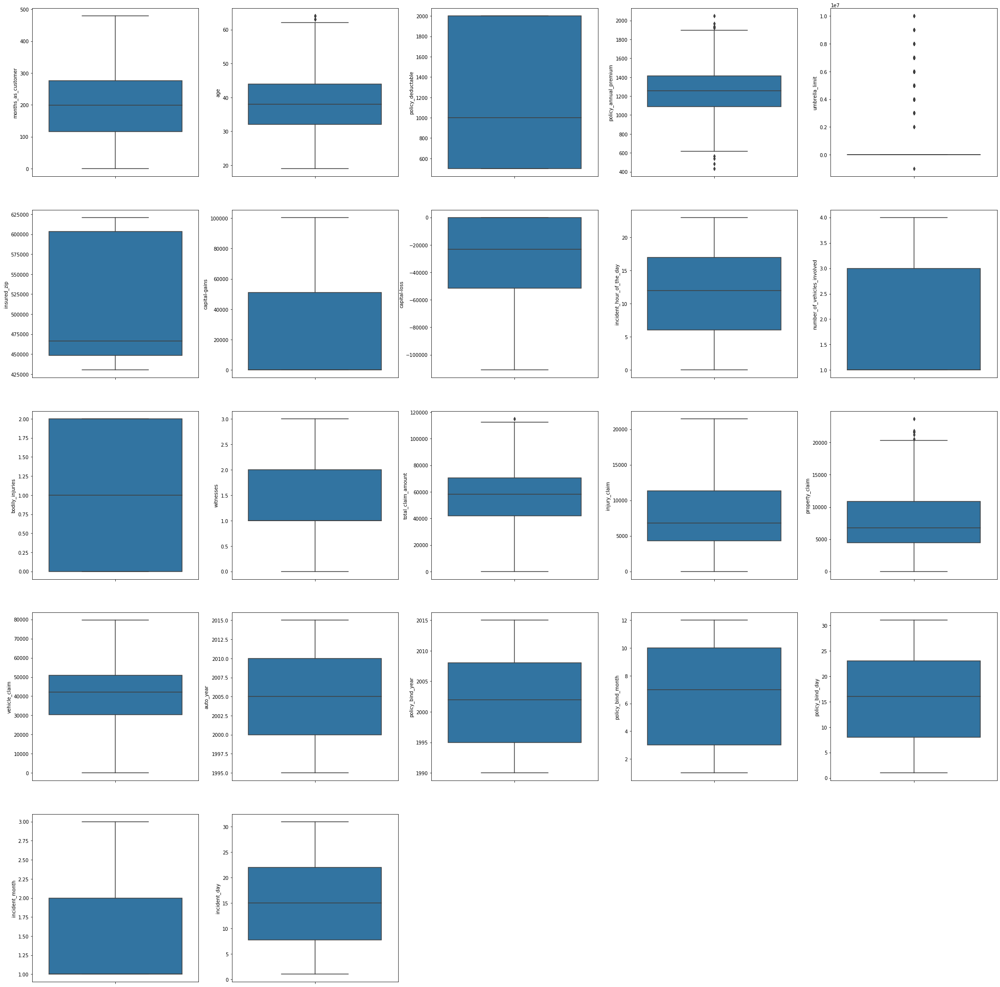

In [32]:
fig = plt.figure(figsize=(36,45))

ax1 = plt.subplot(6, 5, 1)
sns.boxplot(y=insurance_claims['months_as_customer'], ax=ax1)

ax2 = plt.subplot(6, 5, 2)
sns.boxplot(y=insurance_claims['age'], ax=ax2)

ax3 = plt.subplot(6, 5, 3)
sns.boxplot(y=insurance_claims['policy_deductable'], ax=ax3)

ax4 = plt.subplot(6, 5, 4)
sns.boxplot(y=insurance_claims['policy_annual_premium'], ax=ax4)

ax5 = plt.subplot(6, 5, 5)
sns.boxplot(y=insurance_claims['umbrella_limit'], ax=ax5)

ax6 = plt.subplot(6, 5, 6)
sns.boxplot(y=insurance_claims['insured_zip'], ax=ax6)
plt.xticks(rotation=45)

ax7 = plt.subplot(6, 5, 7)
sns.boxplot(y=insurance_claims['capital-gains'], ax=ax7)

ax8 = plt.subplot(6, 5, 8)
sns.boxplot(y=insurance_claims['capital-loss'], ax=ax8)

ax9 = plt.subplot(6, 5, 9)
sns.boxplot(y=insurance_claims['incident_hour_of_the_day'], ax=ax9)

ax10 = plt.subplot(6, 5, 10)
sns.boxplot(y=insurance_claims['number_of_vehicles_involved'], ax=ax10)

ax11 = plt.subplot(6, 5, 11)
sns.boxplot(y=insurance_claims['bodily_injuries'], ax=ax11)

ax12 = plt.subplot(6, 5, 12)
sns.boxplot(y=insurance_claims['witnesses'], ax=ax12)

ax13 = plt.subplot(6, 5, 13)
sns.boxplot(y=insurance_claims['total_claim_amount'], ax=ax13)

ax14 = plt.subplot(6, 5, 14)
sns.boxplot(y=insurance_claims['injury_claim'], ax=ax14)

ax15 = plt.subplot(6, 5, 15)
sns.boxplot(y=insurance_claims['property_claim'], ax=ax15)

ax16 = plt.subplot(6, 5, 16)
sns.boxplot(y=insurance_claims['vehicle_claim'], ax=ax16)

ax17 = plt.subplot(6, 5, 17)
sns.boxplot(y=insurance_claims['auto_year'], ax=ax17)
plt.xticks(rotation=45)

ax18 = plt.subplot(6, 5, 18)
sns.boxplot(y=insurance_claims['policy_bind_year'], ax=ax18)

ax19 = plt.subplot(6, 5, 19)
sns.boxplot(y=insurance_claims['policy_bind_month'], ax=ax19)

ax20 = plt.subplot(6, 5, 20)
sns.boxplot(y=insurance_claims['policy_bind_day'], ax=ax20)

ax21 = plt.subplot(6, 5, 21)
sns.boxplot(y=insurance_claims['incident_month'], ax=ax21)

ax22 = plt.subplot(6, 5, 22)
sns.boxplot(y=insurance_claims['incident_day'], ax=ax22)

plt.show()

#### Violin Plots

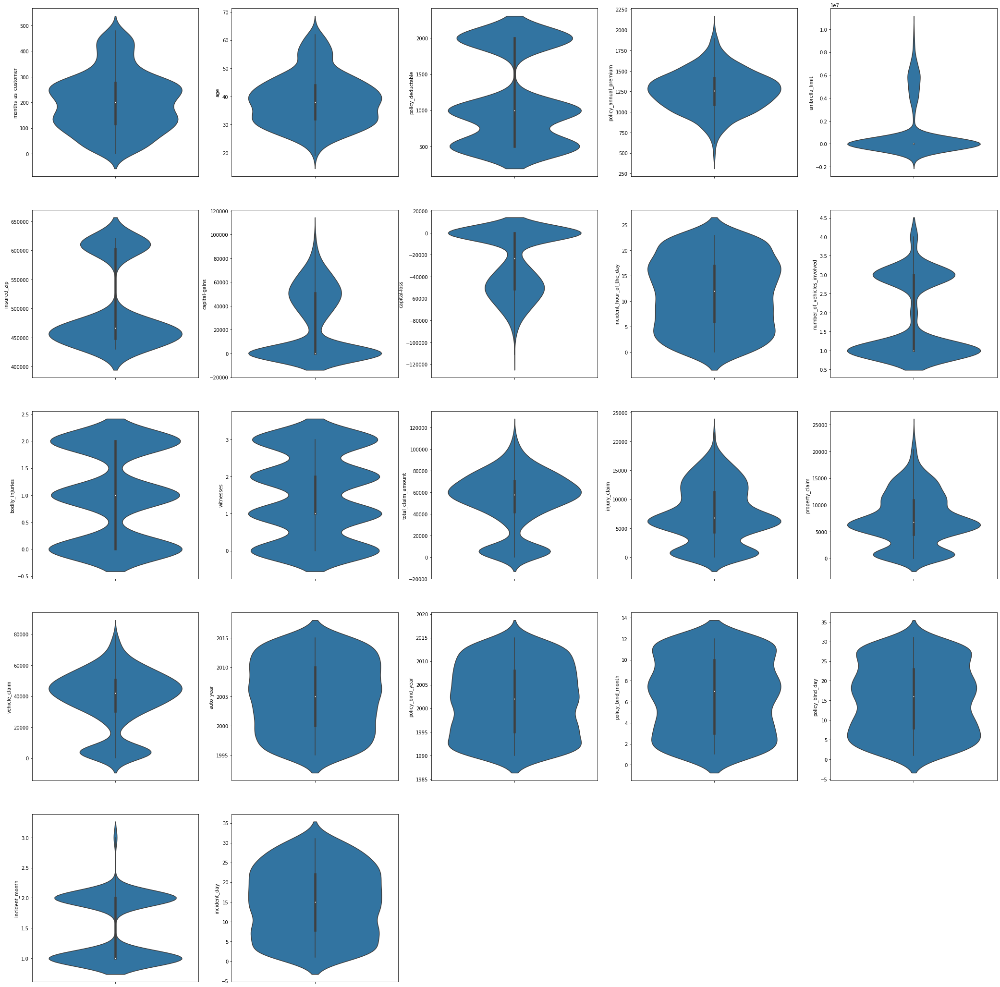

In [33]:
fig = plt.figure(figsize=(36,45))

ax1 = plt.subplot(6, 5, 1)
sns.violinplot(y=insurance_claims['months_as_customer'], ax=ax1)

ax2 = plt.subplot(6, 5, 2)
sns.violinplot(y=insurance_claims['age'], ax=ax2)

ax3 = plt.subplot(6, 5, 3)
sns.violinplot(y=insurance_claims['policy_deductable'], ax=ax3)

ax4 = plt.subplot(6, 5, 4)
sns.violinplot(y=insurance_claims['policy_annual_premium'], ax=ax4)

ax5 = plt.subplot(6, 5, 5)
sns.violinplot(y=insurance_claims['umbrella_limit'], ax=ax5)

ax6 = plt.subplot(6, 5, 6)
sns.violinplot(y=insurance_claims['insured_zip'], ax=ax6)
plt.xticks(rotation=45)

ax7 = plt.subplot(6, 5, 7)
sns.violinplot(y=insurance_claims['capital-gains'], ax=ax7)

ax8 = plt.subplot(6, 5, 8)
sns.violinplot(y=insurance_claims['capital-loss'], ax=ax8)

ax9 = plt.subplot(6, 5, 9)
sns.violinplot(y=insurance_claims['incident_hour_of_the_day'], ax=ax9)

ax10 = plt.subplot(6, 5, 10)
sns.violinplot(y=insurance_claims['number_of_vehicles_involved'], ax=ax10)

ax11 = plt.subplot(6, 5, 11)
sns.violinplot(y=insurance_claims['bodily_injuries'], ax=ax11)

ax12 = plt.subplot(6, 5, 12)
sns.violinplot(y=insurance_claims['witnesses'], ax=ax12)

ax13 = plt.subplot(6, 5, 13)
sns.violinplot(y=insurance_claims['total_claim_amount'], ax=ax13)

ax14 = plt.subplot(6, 5, 14)
sns.violinplot(y=insurance_claims['injury_claim'], ax=ax14)

ax15 = plt.subplot(6, 5, 15)
sns.violinplot(y=insurance_claims['property_claim'], ax=ax15)

ax16 = plt.subplot(6, 5, 16)
sns.violinplot(y=insurance_claims['vehicle_claim'], ax=ax16)

ax17 = plt.subplot(6, 5, 17)
sns.violinplot(y=insurance_claims['auto_year'], ax=ax17)
plt.xticks(rotation=45)

ax18 = plt.subplot(6, 5, 18)
sns.violinplot(y=insurance_claims['policy_bind_year'], ax=ax18)

ax19 = plt.subplot(6, 5, 19)
sns.violinplot(y=insurance_claims['policy_bind_month'], ax=ax19)

ax20 = plt.subplot(6, 5, 20)
sns.violinplot(y=insurance_claims['policy_bind_day'], ax=ax20)

ax21 = plt.subplot(6, 5, 21)
sns.violinplot(y=insurance_claims['incident_month'], ax=ax21)

ax22 = plt.subplot(6, 5, 22)
sns.violinplot(y=insurance_claims['incident_day'], ax=ax22)

plt.show()

### <a id='b2_ID'> 2.2 Bivariate Analysis </a>

#### Count Plots

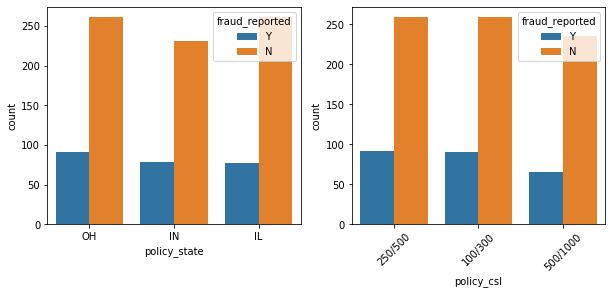

In [40]:
fig = plt.figure(figsize=(10,4))

ax1 = plt.subplot(1, 2, 1)
sns.countplot(insurance_claims['policy_state'], hue=insurance_claims['fraud_reported'], ax=ax1)

ax2 = plt.subplot(1, 2, 2)
sns.countplot(insurance_claims['policy_csl'], hue=insurance_claims['fraud_reported'], ax=ax2)
plt.xticks(rotation=45)

plt.show()

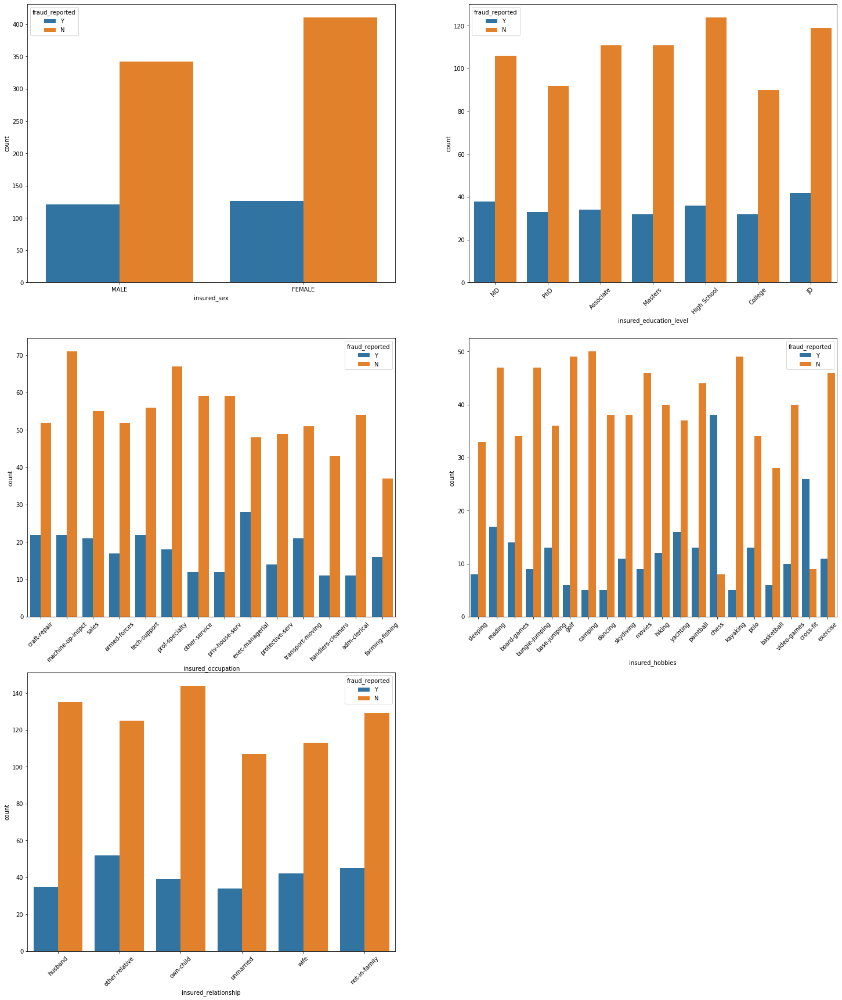

In [41]:
fig = plt.figure(figsize=(25,30))

ax1 = plt.subplot(3, 2, 1)
sns.countplot(x=insurance_claims['insured_sex'], hue=insurance_claims['fraud_reported'], ax=ax1)

ax2 = plt.subplot(3, 2, 2)
sns.countplot(x=insurance_claims['insured_education_level'], hue=insurance_claims['fraud_reported'], ax=ax2)
plt.xticks(rotation=45)

ax3 = plt.subplot(3, 2, 3)
sns.countplot(x=insurance_claims['insured_occupation'], hue=insurance_claims['fraud_reported'], ax=ax3)
plt.xticks(rotation=45)

ax4 = plt.subplot(3, 2, 4)
sns.countplot(x=insurance_claims['insured_hobbies'], hue=insurance_claims['fraud_reported'], ax=ax4)
plt.xticks(rotation=45)

ax5 = plt.subplot(3, 2, 5)
sns.countplot(x=insurance_claims['insured_relationship'], hue=insurance_claims['fraud_reported'], ax=ax5)
plt.xticks(rotation=45)

plt.show()

Interestingly, the count plot by class for 'insured_occupation' showed increased fraud reported as 'Yes' compared to fraud reported as 'No' for 'priv-house-serv'.  For 'insured_hobbies', there were more fraud reported as 'Yes' than 'No' for 'chess' and 'cross-fit' while larger portions of cases had fraud reported as 'No' than 'Yes' for 'sleeping', 'golf', 'camping', 'dancing', 'kayaking', and 'basketball'. 

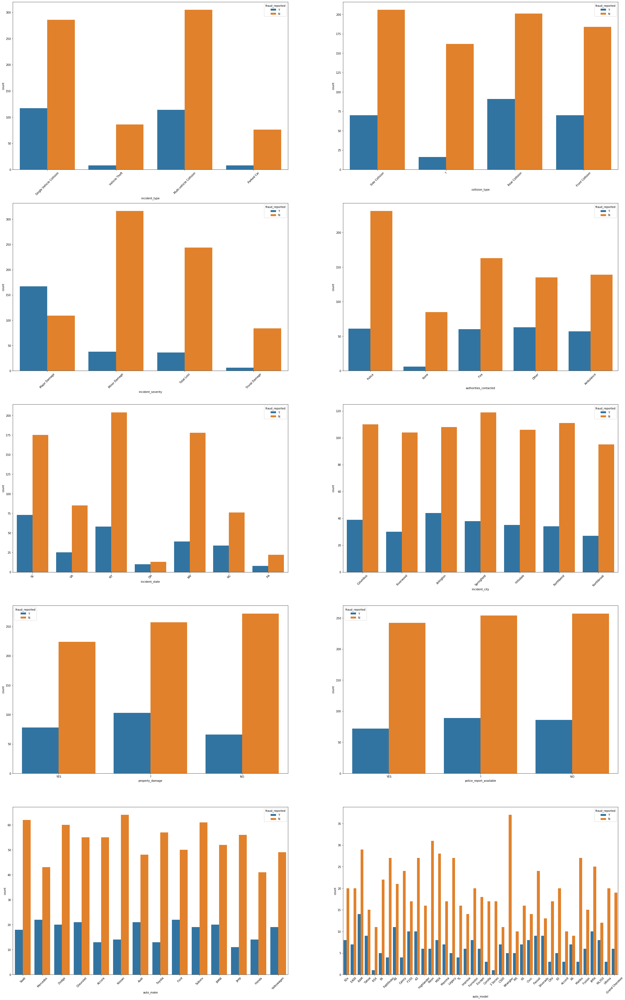

In [42]:
fig = plt.figure(figsize=(40,66))

ax1 = plt.subplot(5, 2, 1)
sns.countplot(x=insurance_claims['incident_type'], hue=insurance_claims['fraud_reported'], ax=ax1)
plt.xticks(rotation=45)

ax2 = plt.subplot(5, 2, 2)
sns.countplot(x=insurance_claims['collision_type'], hue=insurance_claims['fraud_reported'], ax=ax2)
plt.xticks(rotation=45)

ax3 = plt.subplot(5, 2, 3)
sns.countplot(x=insurance_claims['incident_severity'], hue=insurance_claims['fraud_reported'], ax=ax3)
plt.xticks(rotation=45)

ax4 = plt.subplot(5, 2, 4)
sns.countplot(x=insurance_claims['authorities_contacted'], hue=insurance_claims['fraud_reported'], ax=ax4)
plt.xticks(rotation=45)

ax5 = plt.subplot(5, 2, 5)
sns.countplot(x=insurance_claims['incident_state'], hue=insurance_claims['fraud_reported'], ax=ax5)
plt.xticks(rotation=45)

ax6 = plt.subplot(5, 2, 6)
sns.countplot(x=insurance_claims['incident_city'], hue=insurance_claims['fraud_reported'], ax=ax6)
plt.xticks(rotation=45)

ax7 = plt.subplot(5, 2, 7)
sns.countplot(x=insurance_claims['property_damage'], hue=insurance_claims['fraud_reported'], ax=ax7)

ax8 = plt.subplot(5, 2, 8)
sns.countplot(x=insurance_claims['police_report_available'], hue=insurance_claims['fraud_reported'], ax=ax8)

ax9 = plt.subplot(5, 2, 9)
sns.countplot(x=insurance_claims['auto_make'], hue=insurance_claims['fraud_reported'], ax=ax9)
plt.xticks(rotation=45)

ax10 = plt.subplot(5, 2, 10)
sns.countplot(x=insurance_claims['auto_model'], hue=insurance_claims['fraud_reported'], ax=ax10)
plt.xticks(rotation=45)

plt.show()

The count plot by class for 'incident_severity' showed increased fraud reported as 'Yes' than 'No' for 'Major Damage' and 'collision_type' is more likely to be 'rear collision' for fraud reported as 'Yes'.  For 'auto_model', there were more fraud reported as 'Yes'  for particular models such as 'RAM', 'Tahoe', 'A5', 'Silverado', and 'ML350'. 

#### Scatter Plots for Date Attributes

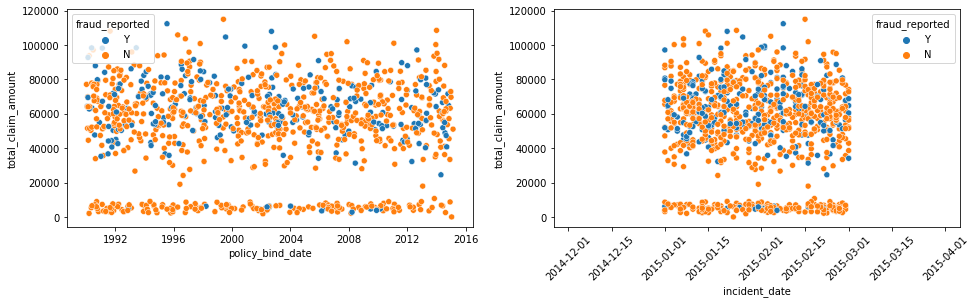

In [764]:
fig = plt.figure(figsize=(16,4))

ax1 = plt.subplot(1, 2, 1)
sns.scatterplot('policy_bind_date', 'total_claim_amount', data=insurance_claims, hue='fraud_reported')

ax2 = plt.subplot(1, 2, 2)
sns.scatterplot('incident_date', 'total_claim_amount', data=insurance_claims, hue='fraud_reported')
plt.xticks(rotation=45)

plt.show()

Data points with 'fraud_reported'='Yes' were spread out among the points with 'fraud_reported'='No' looking at the 'policy_bind_date' and 'incident_date' versus 'total_claim_amount' scatter plots.

#### Boxplots

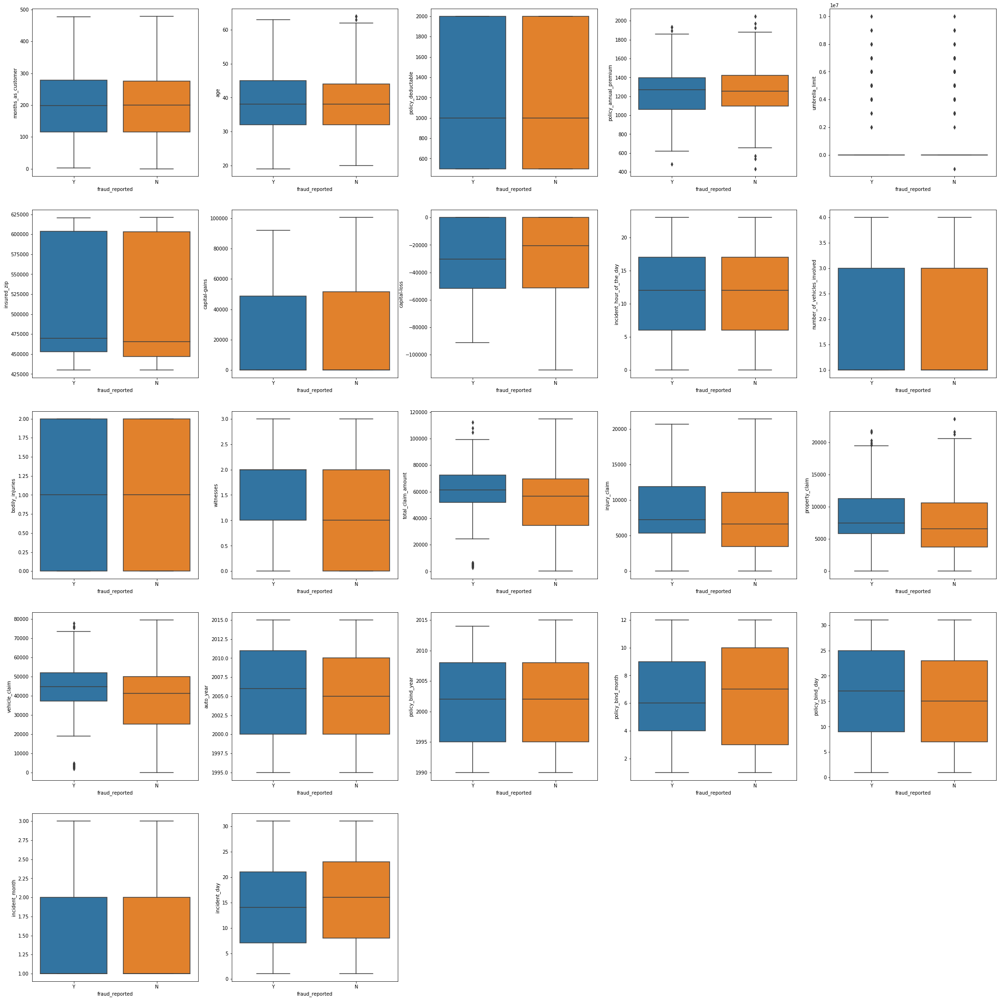

In [43]:
fig = plt.figure(figsize=(36,45))

ax1 = plt.subplot(6, 5, 1)
sns.boxplot(x=insurance_claims['fraud_reported'], y=insurance_claims['months_as_customer'], ax=ax1)

ax2 = plt.subplot(6, 5, 2)
sns.boxplot(x=insurance_claims['fraud_reported'], y=insurance_claims['age'], ax=ax2)

ax3 = plt.subplot(6, 5, 3)
sns.boxplot(x=insurance_claims['fraud_reported'], y=insurance_claims['policy_deductable'], ax=ax3)

ax4 = plt.subplot(6, 5, 4)
sns.boxplot(x=insurance_claims['fraud_reported'], y=insurance_claims['policy_annual_premium'], ax=ax4)

ax5 = plt.subplot(6, 5, 5)
sns.boxplot(x=insurance_claims['fraud_reported'], y=insurance_claims['umbrella_limit'], ax=ax5)

ax6 = plt.subplot(6, 5, 6)
sns.boxplot(x=insurance_claims['fraud_reported'], y=insurance_claims['insured_zip'], ax=ax6)

ax7 = plt.subplot(6, 5, 7)
sns.boxplot(x=insurance_claims['fraud_reported'], y=insurance_claims['capital-gains'], ax=ax7)

ax8 = plt.subplot(6, 5, 8)
sns.boxplot(x=insurance_claims['fraud_reported'], y=insurance_claims['capital-loss'], ax=ax8)

ax9 = plt.subplot(6, 5, 9)
sns.boxplot(x=insurance_claims['fraud_reported'], y=insurance_claims['incident_hour_of_the_day'], ax=ax9)

ax10 = plt.subplot(6, 5, 10)
sns.boxplot(x=insurance_claims['fraud_reported'], y=insurance_claims['number_of_vehicles_involved'], ax=ax10)

ax11 = plt.subplot(6, 5, 11)
sns.boxplot(x=insurance_claims['fraud_reported'], y=insurance_claims['bodily_injuries'], ax=ax11)

ax12 = plt.subplot(6, 5, 12)
sns.boxplot(x=insurance_claims['fraud_reported'], y=insurance_claims['witnesses'], ax=ax12)

ax13 = plt.subplot(6, 5, 13)
sns.boxplot(x=insurance_claims['fraud_reported'], y=insurance_claims['total_claim_amount'], ax=ax13)

ax14 = plt.subplot(6, 5, 14)
sns.boxplot(x=insurance_claims['fraud_reported'], y=insurance_claims['injury_claim'], ax=ax14)

ax15 = plt.subplot(6, 5, 15)
sns.boxplot(x=insurance_claims['fraud_reported'], y=insurance_claims['property_claim'], ax=ax15)

ax16 = plt.subplot(6, 5, 16)
sns.boxplot(x=insurance_claims['fraud_reported'], y=insurance_claims['vehicle_claim'], ax=ax16)

ax17 = plt.subplot(6, 5, 17)
sns.boxplot(x=insurance_claims['fraud_reported'], y=insurance_claims['auto_year'], ax=ax17)

ax18 = plt.subplot(6, 5, 18)
sns.boxplot(x=insurance_claims['fraud_reported'], y=insurance_claims['policy_bind_year'], ax=ax18)

ax19 = plt.subplot(6, 5, 19)
sns.boxplot(x=insurance_claims['fraud_reported'], y=insurance_claims['policy_bind_month'], ax=ax19)

ax20 = plt.subplot(6, 5, 20)
sns.boxplot(x=insurance_claims['fraud_reported'], y=insurance_claims['policy_bind_day'], ax=ax20)

ax21 = plt.subplot(6, 5, 21)
sns.boxplot(x=insurance_claims['fraud_reported'], y=insurance_claims['incident_month'], ax=ax21)

ax22 = plt.subplot(6, 5, 22)
sns.boxplot(x=insurance_claims['fraud_reported'], y=insurance_claims['incident_day'], ax=ax22)

plt.show()

#### Violin Plots

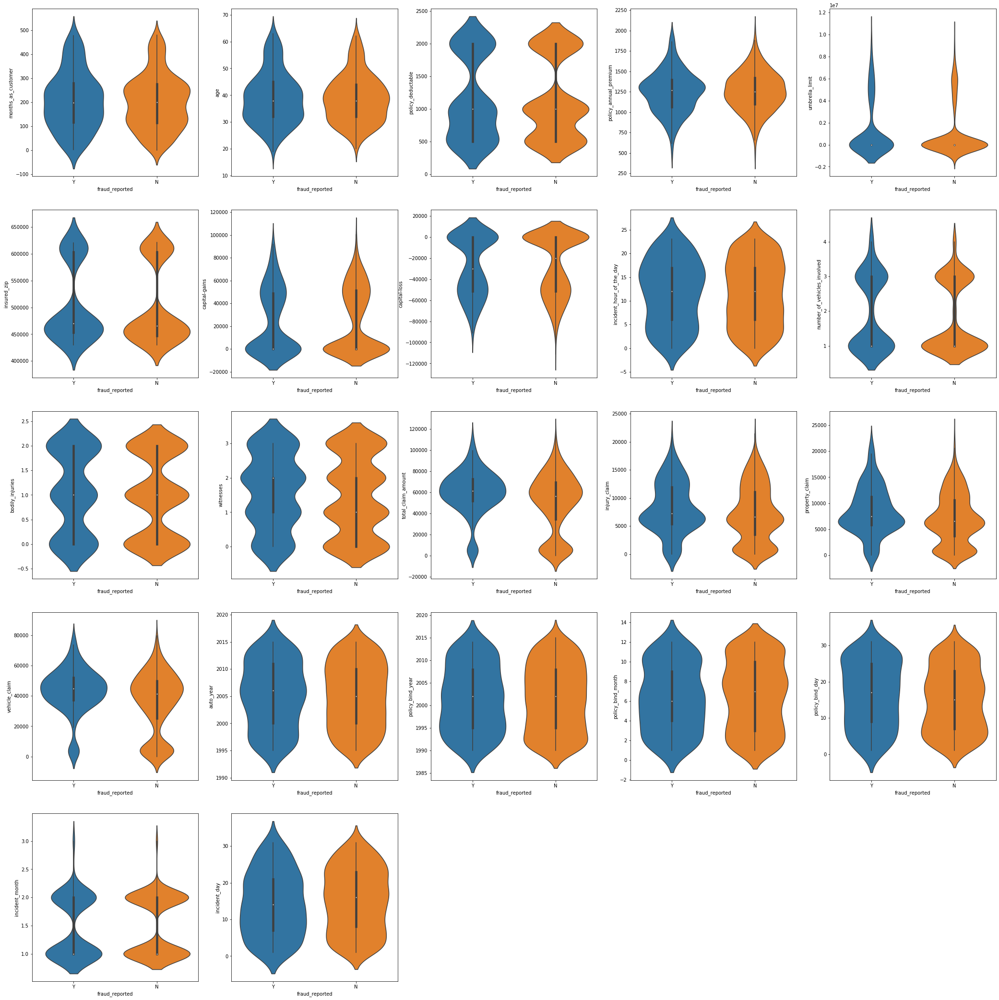

In [44]:
fig = plt.figure(figsize=(36,45))

ax1 = plt.subplot(6, 5, 1)
sns.violinplot(x=insurance_claims['fraud_reported'], y=insurance_claims['months_as_customer'], ax=ax1)

ax2 = plt.subplot(6, 5, 2)
sns.violinplot(x=insurance_claims['fraud_reported'], y=insurance_claims['age'], ax=ax2)

ax3 = plt.subplot(6, 5, 3)
sns.violinplot(x=insurance_claims['fraud_reported'], y=insurance_claims['policy_deductable'], ax=ax3)

ax4 = plt.subplot(6, 5, 4)
sns.violinplot(x=insurance_claims['fraud_reported'], y=insurance_claims['policy_annual_premium'], ax=ax4)

ax5 = plt.subplot(6, 5, 5)
sns.violinplot(x=insurance_claims['fraud_reported'], y=insurance_claims['umbrella_limit'], ax=ax5)

ax6 = plt.subplot(6, 5, 6)
sns.violinplot(x=insurance_claims['fraud_reported'], y=insurance_claims['insured_zip'], ax=ax6)

ax7 = plt.subplot(6, 5, 7)
sns.violinplot(x=insurance_claims['fraud_reported'], y=insurance_claims['capital-gains'], ax=ax7)

ax8 = plt.subplot(6, 5, 8)
sns.violinplot(x=insurance_claims['fraud_reported'], y=insurance_claims['capital-loss'], ax=ax8)

ax9 = plt.subplot(6, 5, 9)
sns.violinplot(x=insurance_claims['fraud_reported'], y=insurance_claims['incident_hour_of_the_day'], ax=ax9)

ax10 = plt.subplot(6, 5, 10)
sns.violinplot(x=insurance_claims['fraud_reported'], y=insurance_claims['number_of_vehicles_involved'], ax=ax10)

ax11 = plt.subplot(6, 5, 11)
sns.violinplot(x=insurance_claims['fraud_reported'], y=insurance_claims['bodily_injuries'], ax=ax11)

ax12 = plt.subplot(6, 5, 12)
sns.violinplot(x=insurance_claims['fraud_reported'], y=insurance_claims['witnesses'], ax=ax12)

ax13 = plt.subplot(6, 5, 13)
sns.violinplot(x=insurance_claims['fraud_reported'], y=insurance_claims['total_claim_amount'], ax=ax13)

ax14 = plt.subplot(6, 5, 14)
sns.violinplot(x=insurance_claims['fraud_reported'], y=insurance_claims['injury_claim'], ax=ax14)

ax15 = plt.subplot(6, 5, 15)
sns.violinplot(x=insurance_claims['fraud_reported'], y=insurance_claims['property_claim'], ax=ax15)

ax16 = plt.subplot(6, 5, 16)
sns.violinplot(x=insurance_claims['fraud_reported'], y=insurance_claims['vehicle_claim'], ax=ax16)

ax17 = plt.subplot(6, 5, 17)
sns.violinplot(x=insurance_claims['fraud_reported'], y=insurance_claims['auto_year'], ax=ax17)

ax18 = plt.subplot(6, 5, 18)
sns.violinplot(x=insurance_claims['fraud_reported'], y=insurance_claims['policy_bind_year'], ax=ax18)

ax19 = plt.subplot(6, 5, 19)
sns.violinplot(x=insurance_claims['fraud_reported'], y=insurance_claims['policy_bind_month'], ax=ax19)

ax20 = plt.subplot(6, 5, 20)
sns.violinplot(x=insurance_claims['fraud_reported'], y=insurance_claims['policy_bind_day'], ax=ax20)

ax21 = plt.subplot(6, 5, 21)
sns.violinplot(x=insurance_claims['fraud_reported'], y=insurance_claims['incident_month'], ax=ax21)

ax22 = plt.subplot(6, 5, 22)
sns.violinplot(x=insurance_claims['fraud_reported'], y=insurance_claims['incident_day'], ax=ax22)

plt.show()

The class attribute shows similar distributions when Fraud Reported is 'Yes' and 'No' for the numerical attributes.

#### Pair Plots with Scatterplots

In [36]:
# Visualize relationship between independent and dependent variables
sns.pairplot(insurance_claims, height=5)